In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v7.0-56-gc0ca1d2 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.1/78.2 GB disk)


In [ ]:
!curl -L "https://public.roboflow.com/ds/UmmtHZTRJR?key=zS1K1vARct" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   1215      0 --:--:-- --:--:-- --:--:--  1214
100 18.5M  100 18.5M    0     0  5390k      0  0:00:03  0:00:03 --:--:-- 10.3M
Archive:  roboflow.zip
 extracting: test/images/1288126-10255706714jpg_jpg.rf.ed230c79fdbb1fa0650ff4fd32f620ee.jpg  
 extracting: test/images/shutterstock_1627199179_jpg.rf.350e69105dd1458572a590c3e3ef2538.jpg  
 extracting: test/images/15391513324714o1n0r10n6_jpg.rf.eb6b6b796ad74b0c9d75011d1020f0af.jpg  
 extracting: train/images/1125506397_15801322206131n_jpg.rf.0a60284a71b2d0ed77c002e768b39b00.jpg  
 extracting: test/images/1579924271_jpg.rf.1fea0f43731fbea2876f63135256004f.jpg  
 extracting: train/images/1_R_kFK9pNLfKAuopY_lAaPQ_jpeg.rf.030922effaedbead963acea666441dbd.jpg  
 extracting: test/images/1224331650_g_400-w_g_jpg.rf.483a35a2395bf48e96783587a59fe876.jpg  
 extra

In [ ]:
%mkdir /content/yolov5/first
%cd first

# %rm -r labels
# %rm -r test
# %rm -r train
# %rm -r val

%mkdir images
%mkdir allJson


/content/yolov5/first


In [ ]:
%cd images

# !unzip -qq "/content/drive/MyDrive/해커톤 데이터/Image/F01Image.zip"
# !unzip -qq "/content/drive/MyDrive/해커톤 데이터/Image/F02Image.zip"
# !unzip -qq "/content/drive/MyDrive/해커톤 데이터/Image/F03Image.zip"
!unzip -qq "/content/drive/MyDrive/해커톤 데이터/Image/F04Image.zip"
# !unzip -qq "/content/drive/MyDrive/해커톤 데이터/Image/F05Image.zip"

[Errno 2] No such file or directory: 'images'
/content/yolov5/first/images


In [ ]:
%cd ../allJson

# !unzip -qq "/content/drive/MyDrive/해커톤 데이터/Json/F01Json-Final.zip"
# !unzip -qq "/content/drive/MyDrive/해커톤 데이터/Json/F02Json-Final.zip"
# !unzip -qq "/content/drive/MyDrive/해커톤 데이터/Json/F03Json-Final.zip"
!unzip -qq "/content/drive/MyDrive/해커톤 데이터/Json/F04Json-Final.zip"
# !unzip -qq "/content/drive/MyDrive/해커톤 데이터/Json/F05Json-Final.zip"

/content/yolov5/first/allJson


In [ ]:
%cd /content/yolov5/first
%mkdir labels
%cd labels

import glob
 
val_img_list = glob.glob('/content/yolov5/first/allJson/*')

/content/yolov5/first
/content/yolov5/first/labels


In [ ]:
import json

for i in val_img_list:
    with open(i, 'r') as f:
        json_data = json.load(f)
        height = json_data["images"][0]['height']
        width = json_data["images"][0]['width']
        str_list = json_data["annotations"][0]["bbox"]
        
        new_list = [0,0,0,0]
        new_list[0] = ((str_list[0]+str_list[2])/2)/width
        new_list[1]= ((str_list[1]+str_list[3])/2)/height
        new_list[2] = float((str_list[2]-str_list[0]))/float(width)
        new_list[3]=float((str_list[3]-str_list[1]))/float(height)

        new_list.insert(0, 0)
        result = ' '.join(str(s) for s in new_list)
        
        f = open(i.replace('\\', "/").split('/')[5][:-5]+".txt", 'w')
        f.write(result)
        f.close()
    print(i)
  
  

/content/yolov5/first/allJson/F04_P001_A1_W001_D2022-09-16-10-15-12_0259.json
/content/yolov5/first/allJson/F04_P002_A1_W002_D2022-09-16-10-56-38_0117.json
/content/yolov5/first/allJson/F04_P001_A2_W001_D2022-09-16-10-13-12_0518.json
/content/yolov5/first/allJson/F04_P001_A2_W001_D2022-09-16-10-13-12_1591.json
/content/yolov5/first/allJson/F04_P001_A2_W001_D2022-09-16-10-13-12_0955.json
/content/yolov5/first/allJson/F04_P001_A2_W001_D2022-09-16-10-13-12_1515.json
/content/yolov5/first/allJson/F04_P001_A2_W001_D2022-09-16-10-13-12_2617.json
/content/yolov5/first/allJson/F04_P002_A1_W002_D2022-09-16-10-56-38_0186.json
/content/yolov5/first/allJson/F04_P002_A1_W002_D2022-09-16-10-56-38_0421.json
/content/yolov5/first/allJson/F04_P002_A1_W002_D2022-09-16-10-56-38_0284.json
/content/yolov5/first/allJson/F04_P002_A1_W002_D2022-09-16-10-56-38_0530.json
/content/yolov5/first/allJson/F04_P001_A2_W001_D2022-09-16-10-13-12_0991.json
/content/yolov5/first/allJson/F04_P002_A1_W002_D2022-09-16-10-56

In [ ]:
%cd ..
%rm -r allJson
!pip install split-folders

import glob
import os
import splitfolders

splitfolders.ratio("/content/yolov5/first/", output="/content/yolov5/first", seed=1337, ratio=(.6, .2, .2))


/content/yolov5/first
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Copying files: 8000 files [00:44, 179.37 files/s]


In [ ]:
%cd /content/yolov5/first
%rm -r images
%rm -r labels

/content/yolov5/first


In [ ]:
#data.yaml 파일 수정
%cd /content/yolov5
!python train.py --batch 16 --epochs 10 --data "data.yaml" --cfg models/yolov5s.yaml  --weights yolov5s.pt --name test_yolov5s_100 --device 0

/content/yolov5
train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=0, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=test_yolov5s_100, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-56-gc0ca1d2 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/

<IPython.core.display.Javascript object>

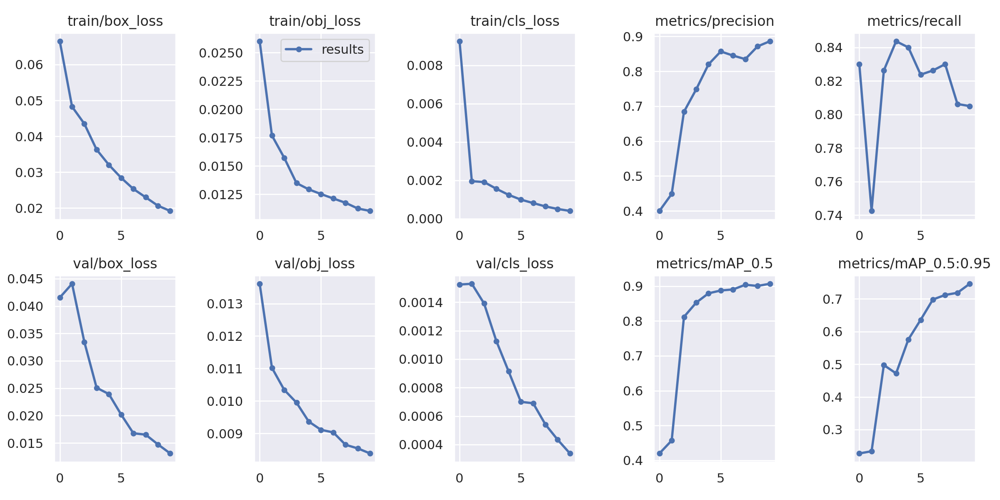

In [ ]:
from IPython.display import Image
from utils.plots import plot_results 
 
Image(filename='/content/yolov5/runs/train/test_yolov5s_100/results.png', width=1000)

In [ ]:
import glob
 
val_img_list = glob.glob('/content/yolov5/first/val/images/*')

detect: weights=['/content/yolov5/runs/train/test_yolov5s_100/weights/best.pt'], source=/content/yolov5/first/val/images/F04_P001_A2_W001_D2022-09-16-10-13-12_0985.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-56-gc0ca1d2 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/yolov5/first/val/images/F04_P001_A2_W001_D2022-09-16-10-13-12_0985.jpg: 256x416 1 worker, 13.5ms
Speed: 0.5ms pre-process, 13.5ms inference, 6.5ms NMS per image at shape (1, 3, 416, 416)
Results saved to runs/detect/exp


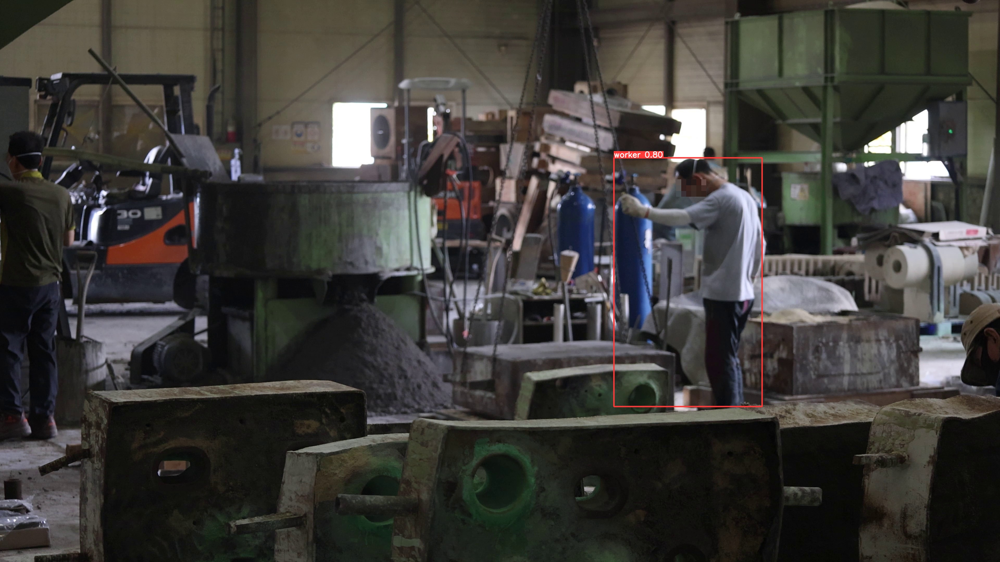

In [ ]:
from IPython.display import Image
import os
 
val_img_path = val_img_list[10]
 
!python detect.py --weights /content/yolov5/runs/train/test_yolov5s_100/weights/best.pt --img 416 --conf 0.5 --exist-ok --source "{val_img_path}"
 
Image(os.path.join('/content/yolov5/runs/detect/exp', os.path.basename(val_img_path)))

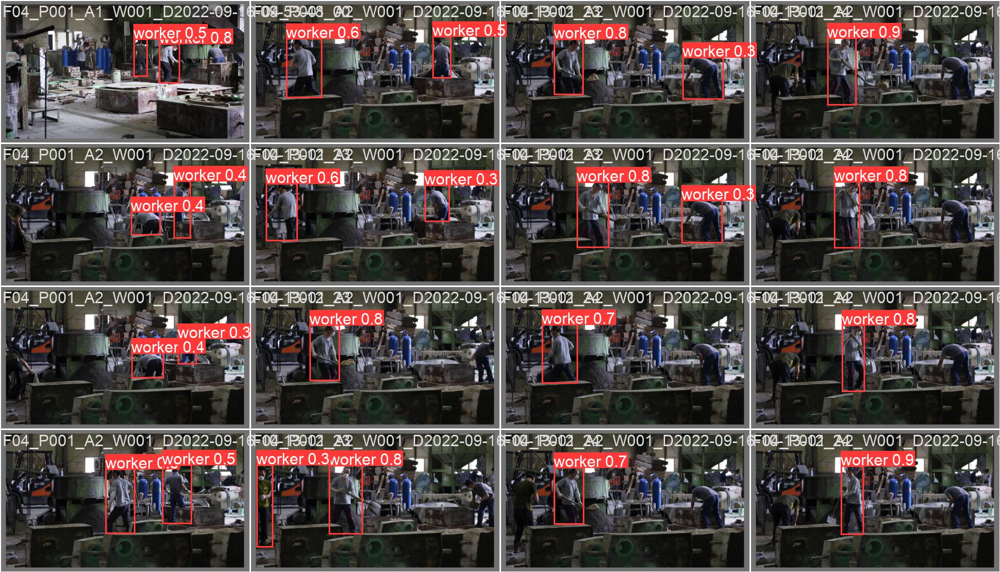

In [ ]:
Image("/content/yolov5/runs/train/test_yolov5s_100/val_batch0_pred.jpg")

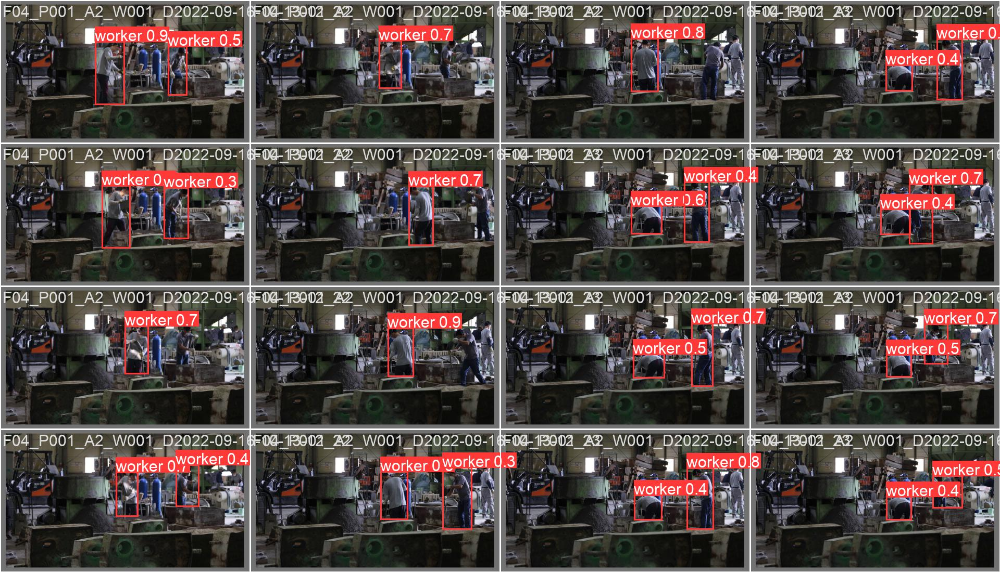

In [ ]:
Image("/content/yolov5/runs/train/test_yolov5s_100/val_batch1_pred.jpg")